## In this tutorial wil be used dataset from this competition. 
https://compete.hexagon-ml.com/practice/competition/1/
    
## The main goal of this file is to use simple, yet effective AutoML technics to build robust predictions.      
    

## Libraries 

In [1]:
import pandas as pd
import numpy as np 
import matplotlib
import seaborn as sn
import matplotlib.pyplot as plt

pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)
from pandas_profiling import ProfileReport

import h2o
from h2o.automl import H2OAutoML, get_leaderboard
h2o.init()

train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')
submit = pd.read_csv('submissionsample.csv')

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.6" 2020-01-14; OpenJDK Runtime Environment (build 11.0.6+10-post-Ubuntu-1ubuntu118.04.1); OpenJDK 64-Bit Server VM (build 11.0.6+10-post-Ubuntu-1ubuntu118.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.6/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp6bd2ru2m
  JVM stdout: /tmp/tmp6bd2ru2m/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmp6bd2ru2m/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O cluster uptime:,01 secs
H2O cluster timezone:,Etc/GMT
H2O data parsing timezone:,UTC
H2O cluster version:,3.28.1.2
H2O cluster version age:,20 days
H2O cluster name:,H2O_from_python_unknownUser_y89azx
H2O cluster total nodes:,1
H2O cluster free memory:,7.838 Gb
H2O cluster total cores:,12
H2O cluster allowed cores:,12
H2O cluster status:,"accepting new members, healthy"


## EDA

In [2]:
train.head()

,ID,elevation,aspect,slope,horizontal_distance_to_hydrology,vertical_distance_to_hydrology,horizontal_distance_to_roadways,hillshade_9am,hillshade_noon,hillshade_3pm,horizontal_distance_to_fire_points,wilderness_area_1,wilderness_area_2,wilderness_area_3,wilderness_area_4,soil_type_1,soil_type_2,soil_type_3,soil_type_4,soil_type_5,soil_type_6,soil_type_7,soil_type_8,soil_type_9,soil_type_10,soil_type_11,soil_type_12,soil_type_13,soil_type_14,soil_type_15,soil_type_16,soil_type_17,soil_type_18,soil_type_19,soil_type_20,soil_type_21,soil_type_22,soil_type_23,soil_type_24,soil_type_25,soil_type_26,soil_type_27,soil_type_28,soil_type_29,soil_type_30,soil_type_31,soil_type_32,soil_type_33,soil_type_34,soil_type_35,soil_type_36,soil_type_37,soil_type_38,soil_type_39,soil_type_40,cover_type
0,86315,2681,342,19,67,19,2012,179,209,167,1814,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,2
1,57241,2922,232,8,350,26,5770,207,248,178,5582,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,2
2,226210,2577,311,25,90,45,1114,143,213,206,1539,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,6
3,45258,2926,264,20,150,46,6279,164,245,217,4650,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2
4,189651,3017,0,3,0,0,3020,215,234,156,466,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [3]:
test.head()

,ID,elevation,aspect,slope,horizontal_distance_to_hydrology,vertical_distance_to_hydrology,horizontal_distance_to_roadways,hillshade_9am,hillshade_noon,hillshade_3pm,horizontal_distance_to_fire_points,wilderness_area_1,wilderness_area_2,wilderness_area_3,wilderness_area_4,soil_type_1,soil_type_2,soil_type_3,soil_type_4,soil_type_5,soil_type_6,soil_type_7,soil_type_8,soil_type_9,soil_type_10,soil_type_11,soil_type_12,soil_type_13,soil_type_14,soil_type_15,soil_type_16,soil_type_17,soil_type_18,soil_type_19,soil_type_20,soil_type_21,soil_type_22,soil_type_23,soil_type_24,soil_type_25,soil_type_26,soil_type_27,soil_type_28,soil_type_29,soil_type_30,soil_type_31,soil_type_32,soil_type_33,soil_type_34,soil_type_35,soil_type_36,soil_type_37,soil_type_38,soil_type_39,soil_type_40
0,6,2606,45,7,270,5,633,222,225,138,6256,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
1,47,2536,99,6,234,0,659,230,232,136,5475,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,49,2489,100,7,85,13,810,232,231,131,5334,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,55,2722,315,24,30,19,3216,148,212,200,6132,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,59,2489,42,6,162,13,810,221,227,141,5247,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [4]:
submit.head()

,ID,cover_type
0,6,2
1,47,4
2,49,6
3,55,6
4,59,1


In [5]:
print("Train share {}. Test shape {}".format(train.shape, test.shape))

Train share (464809, 56). Test shape (116202, 55)


In [6]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,464809.0,290491.415119,167683.440530,1.0,145317.0,290374.0,435671.0,581010.0
elevation,464809.0,2959.065513,280.238784,1859.0,2809.0,2995.0,3163.0,3858.0
aspect,464809.0,155.669240,111.928145,0.0,58.0,127.0,261.0,360.0
slope,464809.0,14.102769,7.486209,0.0,9.0,13.0,18.0,66.0
horizontal_distance_to_hydrology,464809.0,269.507303,212.692246,0.0,108.0,218.0,384.0,1397.0
vertical_distance_to_hydrology,464809.0,46.430258,58.281514,-173.0,7.0,30.0,69.0,601.0
horizontal_distance_to_roadways,464809.0,2349.118561,1559.656990,0.0,1104.0,1994.0,3327.0,7117.0
hillshade_9am,464809.0,212.147764,26.765885,0.0,198.0,218.0,231.0,254.0
hillshade_noon,464809.0,223.307724,19.770134,0.0,213.0,226.0,237.0,254.0
hillshade_3pm,464809.0,142.516472,38.286979,0.0,119.0,143.0,168.0,254.0


In [7]:
test.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,116202.0,290564.339650,167884.716474,6.0,144977.25,291103.5,436217.75,581011.0
elevation,116202.0,2960.567581,278.963358,1883.0,2810.00,2997.0,3164.00,3858.0
aspect,116202.0,155.607976,111.856534,0.0,58.00,127.0,260.00,360.0
slope,116202.0,14.107537,7.496358,0.0,9.00,13.0,18.00,65.0
horizontal_distance_to_hydrology,116202.0,269.111969,211.978363,0.0,108.00,218.0,384.00,1371.0
vertical_distance_to_hydrology,116202.0,46.373642,58.350392,-166.0,7.00,30.0,69.00,595.0
horizontal_distance_to_roadways,116202.0,2354.274660,1557.642587,0.0,1110.00,2011.0,3331.00,7092.0
hillshade_9am,116202.0,212.139111,26.786115,0.0,198.00,218.0,231.00,254.0
hillshade_noon,116202.0,223.362610,19.763040,0.0,213.00,226.0,237.00,254.0
hillshade_3pm,116202.0,142.575377,38.224980,0.0,119.00,143.0,168.00,253.0


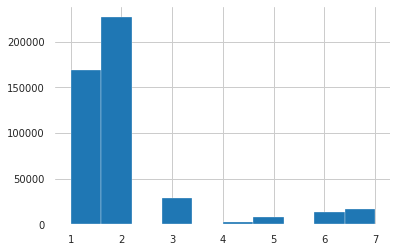

In [8]:
train.cover_type.hist()

In [9]:
train.cover_type.unique()

array([2, 6, 1, 7, 3, 5, 4])

### We got 7 classes and imbalances dataset. 90% of class 1 and 3 and small % of all others 

In [10]:
#spd_profile = ProfileReport(train, title='Train Profiling Report', html={'style':{'full_width':True}})

In [11]:
#spd_profile.to_file(output_file="train_profile.html")
#spd_profile.to_notebook_iframe()

In [12]:
spd_profile = ProfileReport(test, title='Test Profiling Report', html={'style':{'full_width':True}})

In [13]:
spd_profile.to_file(output_file="train_profile.html")
spd_profile.to_notebook_iframe()

### Correlation matrix between features and target (as we see some features are very important)

In [14]:
corr_matrix = train.corr().abs()
corr_matrix = corr_matrix[['cover_type']].sort_values(by='cover_type', ascending=False)
print(corr_matrix)

                                    cover_type
cover_type                            1.000000
wilderness_area_4                     0.324501
elevation                             0.271057
soil_type_10                          0.243728
wilderness_area_1                     0.203961
soil_type_38                          0.161314
horizontal_distance_to_roadways       0.153676
soil_type_39                          0.153109
slope                                 0.148714
soil_type_22                          0.142187
soil_type_23                          0.135981
soil_type_40                          0.129209
soil_type_29                          0.124437
soil_type_2                           0.118371
soil_type_6                           0.113580
horizontal_distance_to_fire_points    0.108855
soil_type_4                           0.100191
hillshade_noon                        0.096468
soil_type_1                           0.092333
soil_type_17                          0.091012
vertical_dist

### Looking for Nan values

In [15]:
train.isna().sum()

ID                                    0
elevation                             0
aspect                                0
slope                                 0
horizontal_distance_to_hydrology      0
vertical_distance_to_hydrology        0
horizontal_distance_to_roadways       0
hillshade_9am                         0
hillshade_noon                        0
hillshade_3pm                         0
horizontal_distance_to_fire_points    0
wilderness_area_1                     0
wilderness_area_2                     0
wilderness_area_3                     0
wilderness_area_4                     0
soil_type_1                           0
soil_type_2                           0
soil_type_3                           0
soil_type_4                           0
soil_type_5                           0
soil_type_6                           0
soil_type_7                           0
soil_type_8                           0
soil_type_9                           0
soil_type_10                          0


In [16]:
test.isna().sum()

ID                                    0
elevation                             0
aspect                                0
slope                                 0
horizontal_distance_to_hydrology      0
vertical_distance_to_hydrology        0
horizontal_distance_to_roadways       0
hillshade_9am                         0
hillshade_noon                        0
hillshade_3pm                         0
horizontal_distance_to_fire_points    0
wilderness_area_1                     0
wilderness_area_2                     0
wilderness_area_3                     0
wilderness_area_4                     0
soil_type_1                           0
soil_type_2                           0
soil_type_3                           0
soil_type_4                           0
soil_type_5                           0
soil_type_6                           0
soil_type_7                           0
soil_type_8                           0
soil_type_9                           0
soil_type_10                          0


### Let's use H2O AutoML to get some quick results

In [17]:
train_h2o = h2o.H2OFrame(train)
test_h2o  = h2o.H2OFrame(test)

x = train_h2o.columns
y = "cover_type"
x.remove(y)


aml = H2OAutoML(max_models=20, seed=1, max_runtime_secs=7000)
aml.train(x=x, y=y, training_frame=train_h2o)

lb = aml.leaderboard
print(lb) 

Parse progress: |█████████████████████████████████████████████████████████| 100%
Parse progress: |█████████████████████████████████████████████████████████| 100%
AutoML progress: |████████████████████████████████████████████████████████| 100%


model_id,mean_residual_deviance,rmse,mse,mae,rmsle
StackedEnsemble_AllModels_AutoML_20200406_152831,0.16357,0.404438,0.16357,0.191583,0.10985
XGBoost_1_AutoML_20200406_152831,0.184073,0.429037,0.184073,0.216386,0.119201
XGBoost_2_AutoML_20200406_152831,0.202286,0.449762,0.202286,0.238063,0.113785


## Save and Load model. Create prediction file

In [18]:
model_path = h2o.save_model(model=aml.leader, path="best_model", force=True)
print(model_path)

saved_model = h2o.load_model(model_path)
preds = saved_model.predict(test_h2o)

submit['cover_type'] = preds.as_data_frame().values.round(0).astype(int)
submit.to_csv('my_submit.csv',index=False)
print("Submit file my_submit.csv")

/notebooks/andy/_Hexagon-ml/Covertype/best_model/StackedEnsemble_AllModels_AutoML_20200406_152831
stackedensemble prediction progress: |████████████████████████████████████| 100%
Submit file my_submit.csv


#### There are limited amount of tasks, that can be managed by with AutoML. Limited amount of metrics, that can be used. 
#### But if you can use it in your practice, then i definetely recomend it. As it allows automatically to try different ideas and approchs. And get high accuracy results in short amount of time 